# Test einer Objektdefinition mit mehreren SEVIRI-Kanälen

Eine Idee, um hoffentlich sinnvolle Objekte zu definieren, ist es analog zum SEVIRI-RGBs vorzugehen. Um konvektive Objekte zu definieren, wären wahrscheinlich das Mikrophysik-RGB oder das Konvektions-RGB vielversprechend.

In [1]:
import pandas as pd
import xarray as xr
import numpy as np

from standard_config import *
import glob

from analysis_tools import grid_and_interpolation as gi
import matplotlib.pyplot as plt

from plotting_tools.colormaps import radar_cmap as rc
from plotting_tools.colormaps import enhanced_colormap
emap = enhanced_colormap(vmin=210,vmed=270,vmax=300)

import sys
sys.path.append("{}/utils/tracking/".format(local_home_path))
import object_tracking as ot
from scipy import ndimage as ndi

sys.path.append("{}/utils".format(local_home_path))
import fixed_colourbar as fc

import seaborn as sns

import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
matplotlib.rc('pdf', fonttype=42)

/vols/satellite/home/lenk/anaconda3/envs/tracking/lib/python3.7/site-packages/xarray/core/merge.py:17: FutureWarning: The Panel class is removed from pandas. Accessing it from the top-level namespace will also be removed in the next version
  PANDAS_TYPES = (pd.Series, pd.DataFrame, pd.Panel)


In [2]:
from l15_msevi import msevi as msv
from l15_msevi.msevi_config import _calibration_constants
import datetime as dt

In [3]:
sys.path.append("{}/utils".format(local_home_path))
from correct_ir039 import correct_ir039

Zuerst laden wir uns die Liste mit den manuell klassifizierten HACI-Fällen, um zu vergleichen, ob eine mögliche Definition für möglichst viele Typen funktioniert.

In [4]:
haci_cases_classified = pd.read_csv("{}/2019-01_trackingstudie/HACI_cases_manually_classified.csv".format(proj_path))

In [5]:
haci_cases_classified.head()

,case_id,Klasse
0,20130318_634,3
1,20130412_1661,2
2,20130412_1683,2
3,20130416_1277,2
4,20130418_924,2


Zuerst sehen wir uns die wirklich isolierten Fälle an.

In [6]:
isolated_cases = haci_cases_classified[haci_cases_classified.Klasse==1]

In [7]:
data_path = "{}/2019-01_trackingstudie/data/lagrangian_tracks/field_data/".format(proj_path)

In [8]:
track_files = glob.glob("{}/*.nc".format(data_path))

In [9]:
isolated_track_files = []

for i, row in isolated_cases.iterrows():
    track_file = "{}track_{}.nc".format(data_path,row.case_id)
    print(track_file)
    isolated_track_files.append(track_file)

/vols/satellite/home/lenk/proj/2019-01_trackingstudie/data/lagrangian_tracks/field_data/track_20130618_1985.nc
/vols/satellite/home/lenk/proj/2019-01_trackingstudie/data/lagrangian_tracks/field_data/track_20130806_469.nc
/vols/satellite/home/lenk/proj/2019-01_trackingstudie/data/lagrangian_tracks/field_data/track_20130817_456.nc


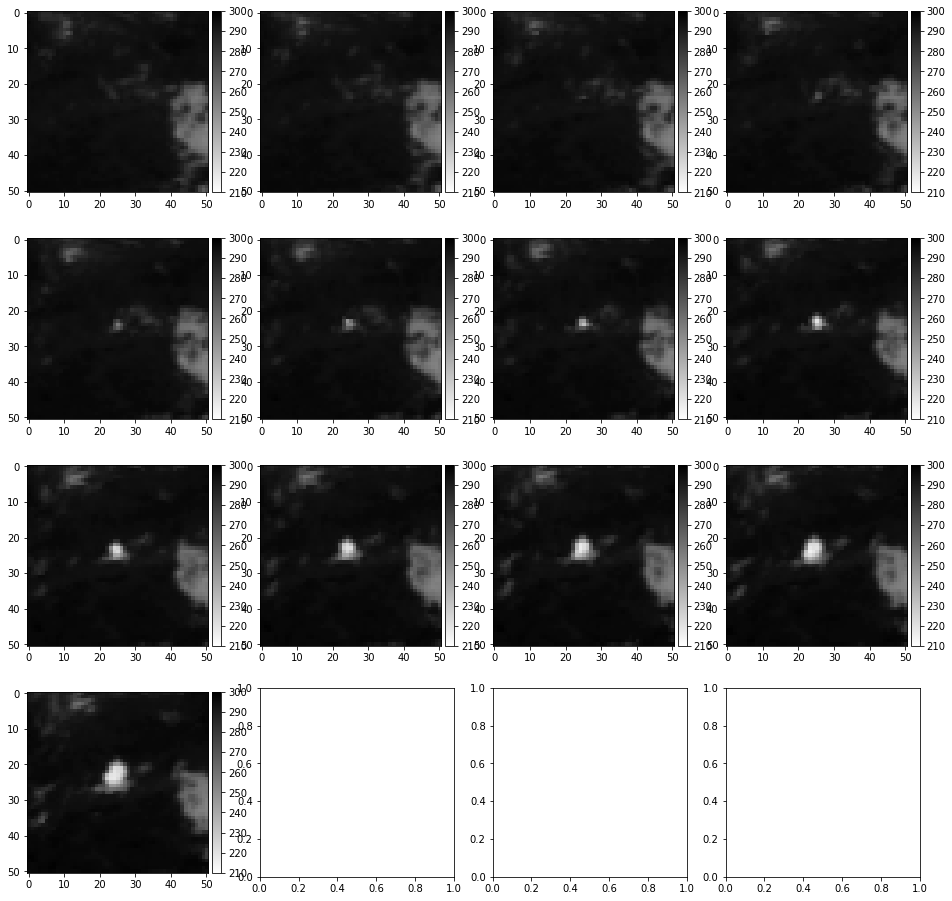

In [10]:
with xr.open_dataset(isolated_track_files[1]) as track_data:

    fig,ax = plt.subplots(4,4,figsize=(16,16))
    axs = ax.ravel()

    for i, d in enumerate(track_data.ir108.data):
        p0 = axs[i].imshow(track_data.ir108.data[i],vmin=210,vmax=300,cmap='gray_r')
        fc.colourbar(p0)

## 1. Überlegungen für die Objektdefinition

Für die Ereknnung konvektiver Auslösung sind in Mecikalski et al. (2010) vor allem folgende SEVIRI-Kanäle als die aussagekräftigsten gefunden worden:

- WV&thinsp;6,2&thinsp;µm
- WV&thinsp;7,3&thinsp;µm
- IR&thinsp;8,7&thinsp;µm
- IR&thinsp;10,8&thinsp;µm
- IR&thinsp;12,0&thinsp;µm

Für eine mögliche multispektrale Objektdefinition, könnte auch der IR&thinsp;3,9&thinsp;µm-Kanal hilfreich sein, weil er Informationen über die Größe von Eispartikeln liefern kann, auch wenn er sowohl solare als auch terrestrische Information enthält.

Weitere hilfreiche Kanäle könnten auch Kanäle im solaren Spektralbereich sein. So z.B. VIS&thinsp;0,6&thinsp;µm und IR&thinsp;1,6&thinsp;µm, derne Differenz auch Informationen über Wolkeneis liefern können.

Wahrscheinlich ist es vielversprechender Differenzen der Kanäle zu verwenden, um möglichst viel Information in die Objektdefinition einzubeziehen.

Aus den SEVIRI-Tagesmikrophysik-, Nachmikrophysik- und Konvektions-RGB abgeleitet, könnten folgende Differenzen hilfreich sein:

- WV&thinsp;6,2&thinsp;µm - WV&thinsp;6,2&thinsp;µm &rarr; Wolkendicke, Wolkenoberkantenhöhe
- IR&thinsp;3,9&thinsp;µm - IR&thinsp;10,8&thinsp;µm &rarr; Wolkenoberkantenvereisung, Eispartikelgröße
- IR&thinsp;1,6&thinsp;µm - VIS&thinsp;0,6&thinsp;µm &rarr; Wolkenoberkantenvereisung
- trispektrale Differenz &rarr; Wolkenoberkantenvereisung

Da sich konvektive Wolken vor allem durch hohe vereiste Wolkenoberkanten und durch dicke Wolken auszeichnen, ist es wahrscheinlich sinnvoll mehrere Differenzen zu kombinieren.

In [11]:
def cutout_box(data, row, col, box_size):
    cutout = gi.cutout_field4box(data,(row,col),box_size)
    
    return cutout

def corrected_ir039_cutout(case_data, case_track, box_size=51):
    import datetime as dt
    ir039 = [determine_IR039_reflectance(dt.datetime.utcfromtimestamp(case_data.time[i]/1e9)) 
             for i in range(len(case_data.ir108.data))]
    
    ir039_ref_cutout = []

    for i,d in enumerate(ir039):
        cutout = cutout_box(ir039[i][1],
                            int(np.rint(case_track.iloc[i].row_index)),
                            int(np.rint(case_track.iloc[i].column_index)),
                            51)
        ir039_ref_cutout.append(cutout)

    ir039_cutout = []

    for i,d in enumerate(ir039):
        cutout = cutout_box(ir039[i][0],
                            int(np.rint(case_track.iloc[i].row_index)),
                            int(np.rint(case_track.iloc[i].column_index)),
                            51)
        ir039_cutout.append(cutout)
        
    return ir039_ref_cutout, ir039_cutout

def extract_wanted_object(clusters):
    # determine the interesting object, it should be in the centre of the 
    # centre time step
    wanted_id = ot.get_wanted_object_id(clusters)
    target_object_id = '{}_{:04d}'.format(len(clusters)//2,wanted_id)
    
    # dirty workaround for jumping objects: delete all but the wanted object in starting time frame
    clusters[len(clusters)//2][np.where(clusters[len(clusters)//2]!=wanted_id)] = 0
    
    # connect the objects of all time steps
    connections, objects = ot.generate_graph_from_components(clusters,
                                                             np.arange(0,len(clusters),1))

    # look for the graph wich cointains this object
    wanted_object_graph = ot.get_wanted_graph(objects,target_object_id)

    # it may be that this is a complex graph, but ideally we only want the
    # path of a single cell
    wanted_object_graph_sorted = ot.sort_graph_by_timesteps(wanted_object_graph)

    object_track = ot.get_main_track(clusters,wanted_object_graph_sorted,target_object_id)

    # get the objects
    wanted_object = ot.get_wanted_objects(clusters,object_track)
    
    return wanted_object

def get_multispectral_object(vis006,ir016,ir039,wv062,wv073,ir108,DWV_thresh=-10,DIR_thresh=20,DVIS_thresh=0.05,dilation=True):
    DWV = wv062 - wv073
    DIR = ir039 - ir108
    DVIS = ir016 - vis006 
    
    DWV_mask = np.ma.masked_less(DWV,DWV_thresh)
    DIR_mask = np.ma.masked_greater(DIR,DIR_thresh)
    DVIS_mask = np.ma.masked_greater(DVIS,DVIS_thresh)
    
    mask = ~DWV_mask.mask & ~DIR_mask.mask & ~DVIS_mask.mask
    
    if dilation:
        return ndi.binary_dilation(mask)
    else:
        return mask
    
def get_multispectral_object2(ir039,wv062,wv073,ir087,ir108,ir120,
                              d62_108_thresh = -50,
                              d39_108_thresh = 15, 
                              dtri_thresh = -4,
                              dilation=False):
    d62_108 = wv062 - ir108
    d39_108 = ir039 - ir108
    dtri = (ir087 - ir108) - (ir108 - ir120)
    
    d62_108_mask = np.ma.masked_greater(d62_108,d62_108_thresh)
    d39_108_mask = np.ma.masked_greater(d39_108,d39_108_thresh)
    dtri_mask = np.ma.masked_greater(dtri,dtri_thresh)
    
    mask = d62_108_mask.mask & d39_108_mask.mask & dtri_mask.mask

    if dilation:
        return ndi.binary_dilation(mask)
    else:
        return mask
    
def determine_IR039_reflectance(day,scan_type='rss'):
    import datetime as dt
    from l15_msevi import msevi as msv
    from l15_msevi.msevi_config import _calibration_constants
    import MSGtools as mst
    import numpy as np
    
    s = msv.MSevi(day,chan_list=['IR_039','IR_108','IR_134'],scan_type=scan_type)
    s.rad2bt()
    
    # CO2-korrigierte Radianz
    DT_CO2 = (s.bt['IR_108'] - s.bt['IR_134']) / 4
    R_corr = s.bt['IR_108']**4 - (s.bt['IR_108'] - DT_CO2)**4
    
    # CO2-korrigierte Helligkeitstemperatur
    bt_039_korr = (s.bt['IR_039']**4 + R_corr)**0.25
    
    # CO2-korrektur für den IR039-Kanal
    R_039_corr = (s.bt['IR_108'] - 0.25 * (s.bt['IR_108'] - s.bt['IR_134']))**4 / (s.bt['IR_108']**4)
    
    # Konstanten
    c1 = 1.19104e-5
    c2 = 1.43877
    nu_c = _calibration_constants[s.sat_type]['nu_c']['IR_039']
    A = _calibration_constants[s.sat_type]['A']['IR_039']
    B = _calibration_constants[s.sat_type]['B']['IR_039']
    
    # Rückumrechnung von BT(10,8) zu L(10,8) mit Konstanten des IR039-Kanals
    R_108 = (c1 * nu_c**3)  / (np.exp((c2*nu_c) / (A*s.bt['IR_108'] + B)) - 1 )
    
    # korrigierte thermische Komponente der Radianz
    R_therm = R_108 * R_039_corr
    
    # CO2-korrigierte Solarkonstante an der Atmosphärenoberseite
    jday = int(day.strftime('%j'))
    esd = 1. - 0.0167 * np.cos( 2*np.pi*(jday-3.) / 365 )
    
    cos_sun_zenith = mst.get_cos_zen(day,scan_type=scan_type)
    cos_sun_zenith[cos_sun_zenith < np.cos(np.deg2rad(80))] = np.cos(np.deg2rad(80))
    cos_sat_zenith = np.cos(np.deg2rad(mst.get_msg_sat_zen(day,sat_type=scan_type)))
    
    solar_constant = 4.92 / esd**2
    CO2_att_cloud_sat = np.exp(-(1 - R_039_corr))
    CO2_att_cloud_sun = np.exp(-(1 - R_039_corr) * (cos_sun_zenith / cos_sat_zenith))
    
    R_toa = solar_constant * cos_sun_zenith * CO2_att_cloud_sat * CO2_att_cloud_sun
    
    # Reflektanz des IR039-Kanals
    ref_039 = ((s.rad['IR_039'] - R_therm) / (R_toa - R_therm))
    
    return bt_039_korr, ref_039

In [12]:
def get_object_locations(track_cutout_data,
                         DWV_thresh=-20,DIR_thresh=10,DVIS_thresh=0.02,dilation=False):
    
    objects = get_multispectral_object(track_cutout_data.vis006.data,
                                       track_cutout_data.ir016.data,
                                       track_cutout_data.ir039.data,
                                       track_cutout_data.wv062.data,
                                       track_cutout_data.wv073.data,
                                       track_cutout_data.ir108.data,
                                       DWV_thresh,DIR_thresh, DVIS_thresh,dilation)   
    
    clusters = [ndi.label(o)[0] for o in objects]
    
    wanted_object = extract_wanted_object(clusters)
    
    obj_idx = [np.where(o!=0) for o in wanted_object]
    
    return clusters, obj_idx

def get_object_locations2(track_cutout_data,
                         DWV_thresh=-30,DIR1_thresh=15,DIR2_thresh=-4,dilation=False):
    # determine possible objects
    objects = get_multispectral_object2(track_cutout_data.ir039.data,
                                        track_cutout_data.wv062.data,
                                        track_cutout_data.wv073.data,
                                        track_cutout_data.ir087.data,
                                        track_cutout_data.ir108.data,
                                        track_cutout_data.ir120.data,
                                        DWV_thresh,DIR1_thresh,DIR2_thresh,dilation)   
    
    # remove remaining cloudfree pixels
    not_cloudy = np.where(track_cutout_data.cma <=1)
    objects[not_cloudy] = 0
    
    # label objects
    clusters = [ndi.label(o)[0] for o in objects]
    
    # extract the wanted object
    wanted_object = extract_wanted_object(clusters)
    
    # get point locations of the wanted object
    obj_idx = [np.where(o!=0) for o in wanted_object]
    
    return clusters, obj_idx

## 2. Ein Beispiel

Wir sehen uns zunächst mal einen isolierten Fall an. Wir definieren das Objekt mit:

- WV&thinsp;6,2&thinsp;µm - WV&thinsp;6,2&thinsp;µm > &minus;20&thinsp;K
- IR&thinsp;3,9&thinsp;µm - IR&thinsp;10,8&thinsp;µm < 10&thinsp;K
- IR&thinsp;1,6&thinsp;µm - VIS&thinsp;0,6&thinsp;µm < 0,02

/vols/satellite/home/lenk/anaconda3/envs/tracking/lib/python3.7/site-packages/ipykernel_launcher.py:12: UserWarning: linewidths is ignored by contourf
  if sys.path[0] == '':
/vols/satellite/home/lenk/anaconda3/envs/tracking/lib/python3.7/site-packages/ipykernel_launcher.py:16: UserWarning: No contour levels were found within the data range.
  app.launch_new_instance()


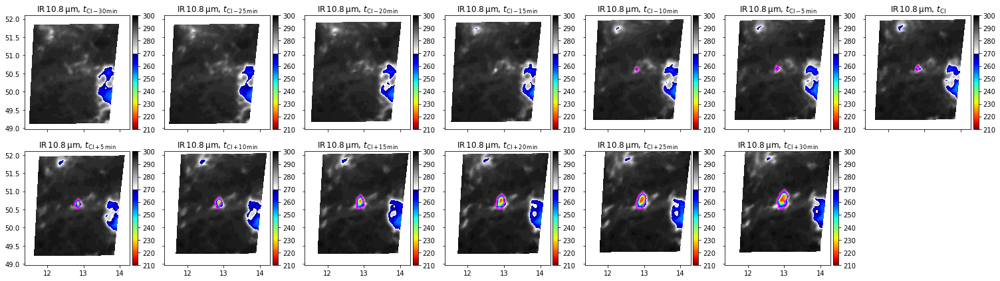

In [13]:
with xr.open_dataset(isolated_track_files[1]) as track_data:
    fig,ax = plt.subplots(2,7,figsize=(3*7,2*3),sharex=True,sharey=True)
    axs = ax.ravel()
    
    obj,obj_idx = get_object_locations2(track_data)

    for i, ir in enumerate(track_data.ir108.data):
        p = axs[i].contourf(track_data.slon.data[i],
                            track_data.slat.data[i],
                            ir,
                            vmin=210,vmax=300, cmap=emap,
                            levels=np.arange(210,301,1),linewidths=0,linestyles=None)

        axs[i].contour(track_data.slon.data[i],
                       track_data.slat.data[i],
                       obj[i],vmin=0,vmax=1,levels=[0,10],cmap='spring',linewidths=2)
        
        if i*5-30 < 0:
            title = r"$\mathrm{IR}\,10.8\,$µm, $t_{\mathrm{CI}" + str(i*5-30)+"\,\mathrm{min}}$"
        elif i*5-30 == 0:
            title = r"$\mathrm{IR}\,10.8\,$µm, $t_\mathrm{CI}$"
        else:
            title = r"$\mathrm{IR}\,10.8\,$µm, $t_{\mathrm{CI}+" + str(i*5-30)+"\,\mathrm{min}}$"
        axs[i].set_title(title)
        fc.colourbar(p)
        
    fig.delaxes(axs[13])
    #plt.suptitle("Example Case")
    plt.tight_layout()

    plt.savefig("{}/pics/Beispiel.pdf".format(local_home_path))

Für diesen Fall scheint das gut zu funktionieren. Allerdings würde hier wahrscheinlich auch ein einzelner IR&thinsp;10,8&thinsp;µm-Schwellwert ausreichen.

/vols/satellite/home/lenk/anaconda3/envs/tracking/lib/python3.7/site-packages/ipykernel_launcher.py:12: UserWarning: linewidths is ignored by contourf
  if sys.path[0] == '':


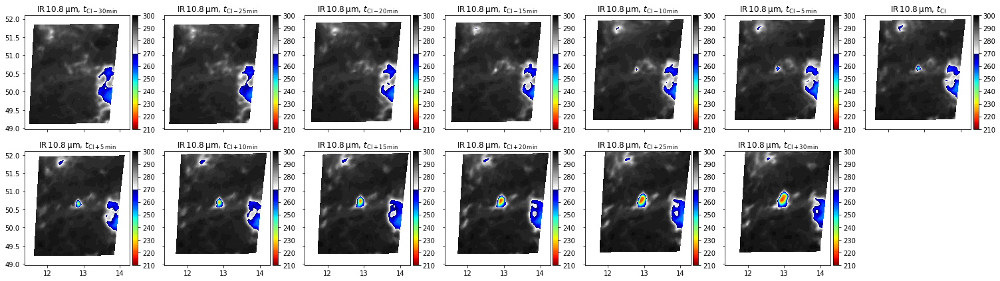

In [14]:
with xr.open_dataset(isolated_track_files[1]) as track_data:
    fig,ax = plt.subplots(2,7,figsize=(3*7,2*3),sharex=True,sharey=True)
    axs = ax.ravel()
    
    obj,obj_idx = get_object_locations2(track_data)

    for i, ir in enumerate(track_data.ir108.data):
        p = axs[i].contourf(track_data.slon.data[i],
                            track_data.slat.data[i],
                            ir,
                            vmin=210,vmax=300, cmap=emap,
                            levels=np.arange(210,301,1),linewidths=0,linestyles=None)

        #axs[i].contour(track_data.slon.data[i],
        #               track_data.slat.data[i],
        #               obj[i],vmin=0,vmax=1,levels=[0,10],cmap='spring',linewidths=2)
        
        if i*5-30 < 0:
            title = r"$\mathrm{IR}\,10.8\,$µm, $t_{\mathrm{CI}" + str(i*5-30)+"\,\mathrm{min}}$"
        elif i*5-30 == 0:
            title = r"$\mathrm{IR}\,10.8\,$µm, $t_\mathrm{CI}$"
        else:
            title = r"$\mathrm{IR}\,10.8\,$µm, $t_{\mathrm{CI}+" + str(i*5-30)+"\,\mathrm{min}}$"
        axs[i].set_title(title)
        fc.colourbar(p)
        
    fig.delaxes(axs[13])
    #plt.suptitle("Example Case")
    plt.tight_layout()

    plt.savefig("{}/pics/Beispiel1.pdf".format(local_home_path))

Als nächstes sehen wir uns mal weitere Fälle an.

In [15]:
with xr.open_dataset(isolated_track_files[1]) as track_data:
    ir108_values = [d[obj_idx[i]] for i, d in enumerate(track_data.ir108.data)]
    cth_values = [d[obj_idx[i]] for i, d in enumerate(track_data.ctth.data)]

In [16]:
median_values = []
min_values = []
max_values = []
q25_values = []
q75_values = []

values = []
time_index = []
ti = np.arange(-30,35,5)
for i, v in enumerate(ir108_values):
    try:
        median_values.append(np.nanmedian(v))
    except:
        median_values.append(np.nan)
        
    try:
        min_values.append(np.nanmin(v))
    except:
        min_values.append(np.nan)
    try:
        max_values.append(np.nanmax(v))
    except:
        max_values.append(np.nan)  
        
    try: 
        q25_values.append(np.percentile(v,25))
    except:
        q25_values.append(np.nan)
        
    try:
        values.extend(v)
        time_index.extend([ti[i]]*len(v))
    except:
        continue      
    

/vols/satellite/home/lenk/anaconda3/envs/tracking/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1076: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)


In [17]:
min_values

[nan,
 nan,
 nan,
 nan,
 257.66,
 248.6314,
 244.00660000000002,
 219.95940000000002,
 224.1844,
 221.2945,
 216.8273,
 215.37230000000002,
 218.2424]

In [18]:
values_df = pd.DataFrame({'values':values,'time':time_index})

Text(0, 0.5, 'T$_\\mathrm{B}$(10,8 µm) / K')

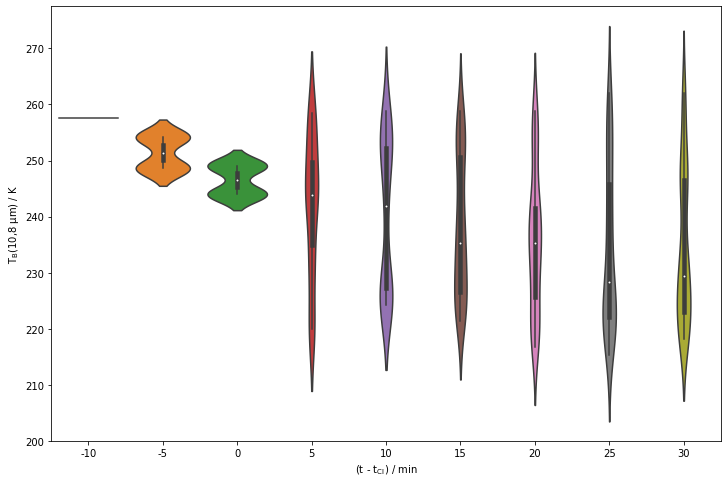

In [19]:
fig,ax = plt.subplots(1,1,figsize=(12,8))
ax = sns.violinplot(x='time',y='values',data=values_df,bw=0.4,notch=True)#,scale='count')
ax.set_xlabel(r"(t - t$_\mathrm{CI}$) / min")
ax.set_ylabel(r"T$_\mathrm{B}$(10,8 µm) / K")

In [20]:
isolated_tracks = haci_cases_classified[haci_cases_classified.Klasse==1]

In [21]:
isolated_tracks

,case_id,Klasse
113,20130618_1985,1
308,20130806_469,1
359,20130817_456,1


In [22]:
d62_108_thresh = -50
d39_108_thresh = 10
d39_120_thresh = 20
dtri_thresh = -4

In [23]:
track_data = xr.open_dataset("{dp}/track_{id}.nc".format(dp=data_path,id="20130806_469"))

In [24]:
test = (track_data.ir039 - track_data.ir108) - (track_data.ir039 - track_data.ir120)

In [25]:
d39_120 = track_data.ir039 - track_data.ir120

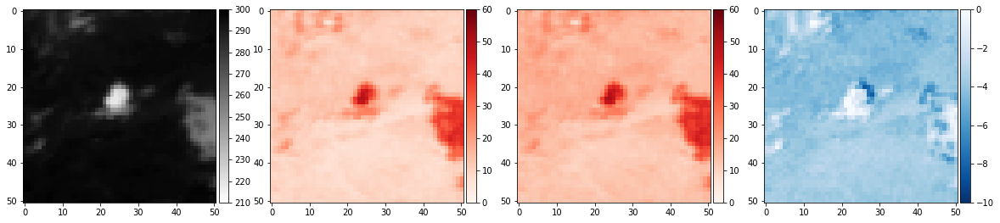

In [41]:
fig,ax = plt.subplots(1,4,figsize=(20,5))
p0 = ax[0].imshow(track_data.ir108.data[-1],vmin=210,vmax=300,cmap='gray_r')
fc.colourbar(p0)
p1 = ax[1].imshow(track_data.ir039.data[-1] - track_data.ir108.data[-1],vmin=0,vmax=60,cmap='Reds')
#p1 = ax[1].contourf(track_data.ir039.data[-1] - track_data.ir108.data[-1],np.arange(0,60,5),vmin=0,vmax=60,cmap='Reds')
#p1 = ax[1].imshow(test[6],cmap='Blues_r')
fc.colourbar(p1)
p2 = ax[2].imshow(d39_120[-1],vmin=0,vmax=60,cmap='Reds')
#p2 = ax[2].contourf(d39_120[-1],np.array(0,31,5),vmin=0,vmax=30,cmap='Reds')
#p2 = ax[2].imshow(dtri[6],vmin=-10,vmax=10,cmap='RdBu_r')
fc.colourbar(p2)
p3 = ax[3].imshow(test[-1],vmin=-10,vmax=0,cmap='Blues_r')
fc.colourbar(p3)

/vols/satellite/home/lenk/anaconda3/envs/tracking/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # This is added back by InteractiveShellApp.init_path()
/vols/satellite/home/lenk/anaconda3/envs/tracking/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # This is added back by InteractiveShellApp.init_path()
/vols/satellite/home/lenk/anaconda3/envs/tracking/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: More than 20 figur

/vols/satellite/home/lenk/anaconda3/envs/tracking/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # This is added back by InteractiveShellApp.init_path()
/vols/satellite/home/lenk/anaconda3/envs/tracking/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # This is added back by InteractiveShellApp.init_path()
/vols/satellite/home/lenk/anaconda3/envs/tracking/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: More than 20 figur

/vols/satellite/home/lenk/anaconda3/envs/tracking/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # This is added back by InteractiveShellApp.init_path()
/vols/satellite/home/lenk/anaconda3/envs/tracking/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # This is added back by InteractiveShellApp.init_path()
/vols/satellite/home/lenk/anaconda3/envs/tracking/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: More than 20 figur

/vols/satellite/home/lenk/anaconda3/envs/tracking/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # This is added back by InteractiveShellApp.init_path()
/vols/satellite/home/lenk/anaconda3/envs/tracking/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # This is added back by InteractiveShellApp.init_path()
/vols/satellite/home/lenk/anaconda3/envs/tracking/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: More than 20 figur

/vols/satellite/home/lenk/anaconda3/envs/tracking/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # This is added back by InteractiveShellApp.init_path()
/vols/satellite/home/lenk/anaconda3/envs/tracking/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # This is added back by InteractiveShellApp.init_path()
/vols/satellite/home/lenk/anaconda3/envs/tracking/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: More than 20 figur

/vols/satellite/home/lenk/anaconda3/envs/tracking/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # This is added back by InteractiveShellApp.init_path()
/vols/satellite/home/lenk/anaconda3/envs/tracking/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # This is added back by InteractiveShellApp.init_path()
/vols/satellite/home/lenk/anaconda3/envs/tracking/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: More than 20 figur

/vols/satellite/home/lenk/anaconda3/envs/tracking/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # This is added back by InteractiveShellApp.init_path()
/vols/satellite/home/lenk/anaconda3/envs/tracking/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # This is added back by InteractiveShellApp.init_path()
/vols/satellite/home/lenk/anaconda3/envs/tracking/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: More than 20 figur

/vols/satellite/home/lenk/anaconda3/envs/tracking/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # This is added back by InteractiveShellApp.init_path()
/vols/satellite/home/lenk/anaconda3/envs/tracking/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # This is added back by InteractiveShellApp.init_path()
/vols/satellite/home/lenk/anaconda3/envs/tracking/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: More than 20 figur

/vols/satellite/home/lenk/anaconda3/envs/tracking/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # This is added back by InteractiveShellApp.init_path()
/vols/satellite/home/lenk/anaconda3/envs/tracking/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # This is added back by InteractiveShellApp.init_path()
/vols/satellite/home/lenk/anaconda3/envs/tracking/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: More than 20 figur

/vols/satellite/home/lenk/anaconda3/envs/tracking/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # This is added back by InteractiveShellApp.init_path()
/vols/satellite/home/lenk/anaconda3/envs/tracking/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # This is added back by InteractiveShellApp.init_path()
/vols/satellite/home/lenk/anaconda3/envs/tracking/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: More than 20 figur

/vols/satellite/home/lenk/anaconda3/envs/tracking/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # This is added back by InteractiveShellApp.init_path()
/vols/satellite/home/lenk/anaconda3/envs/tracking/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # This is added back by InteractiveShellApp.init_path()
/vols/satellite/home/lenk/anaconda3/envs/tracking/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: More than 20 figur

/vols/satellite/home/lenk/anaconda3/envs/tracking/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # This is added back by InteractiveShellApp.init_path()
/vols/satellite/home/lenk/anaconda3/envs/tracking/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # This is added back by InteractiveShellApp.init_path()
/vols/satellite/home/lenk/anaconda3/envs/tracking/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: More than 20 figur

/vols/satellite/home/lenk/anaconda3/envs/tracking/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # This is added back by InteractiveShellApp.init_path()
/vols/satellite/home/lenk/anaconda3/envs/tracking/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # This is added back by InteractiveShellApp.init_path()
/vols/satellite/home/lenk/anaconda3/envs/tracking/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: More than 20 figur

/vols/satellite/home/lenk/anaconda3/envs/tracking/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # This is added back by InteractiveShellApp.init_path()
/vols/satellite/home/lenk/anaconda3/envs/tracking/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # This is added back by InteractiveShellApp.init_path()
/vols/satellite/home/lenk/anaconda3/envs/tracking/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: More than 20 figur

/vols/satellite/home/lenk/anaconda3/envs/tracking/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # This is added back by InteractiveShellApp.init_path()
/vols/satellite/home/lenk/anaconda3/envs/tracking/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # This is added back by InteractiveShellApp.init_path()
/vols/satellite/home/lenk/anaconda3/envs/tracking/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: More than 20 figur

/vols/satellite/home/lenk/anaconda3/envs/tracking/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # This is added back by InteractiveShellApp.init_path()
/vols/satellite/home/lenk/anaconda3/envs/tracking/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # This is added back by InteractiveShellApp.init_path()
/vols/satellite/home/lenk/anaconda3/envs/tracking/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: More than 20 figur

/vols/satellite/home/lenk/anaconda3/envs/tracking/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # This is added back by InteractiveShellApp.init_path()
/vols/satellite/home/lenk/anaconda3/envs/tracking/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # This is added back by InteractiveShellApp.init_path()
/vols/satellite/home/lenk/anaconda3/envs/tracking/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: More than 20 figur

/vols/satellite/home/lenk/anaconda3/envs/tracking/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # This is added back by InteractiveShellApp.init_path()
/vols/satellite/home/lenk/anaconda3/envs/tracking/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # This is added back by InteractiveShellApp.init_path()
/vols/satellite/home/lenk/anaconda3/envs/tracking/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: More than 20 figur

/vols/satellite/home/lenk/anaconda3/envs/tracking/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # This is added back by InteractiveShellApp.init_path()


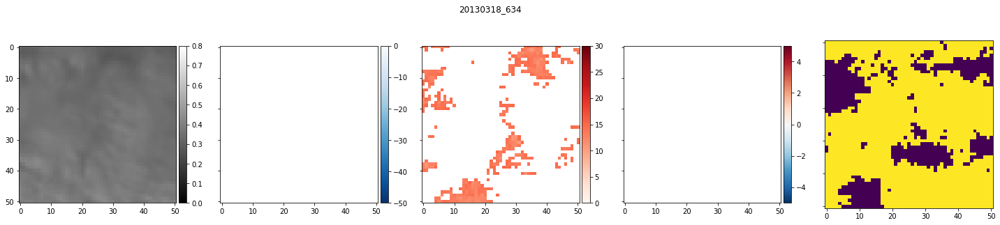

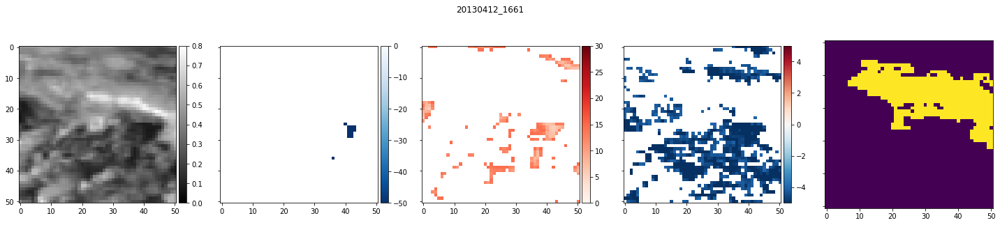

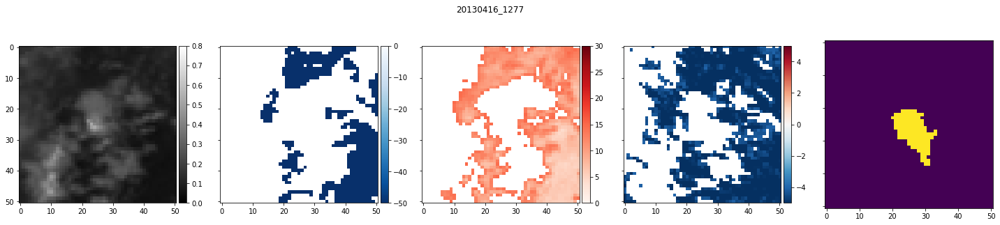

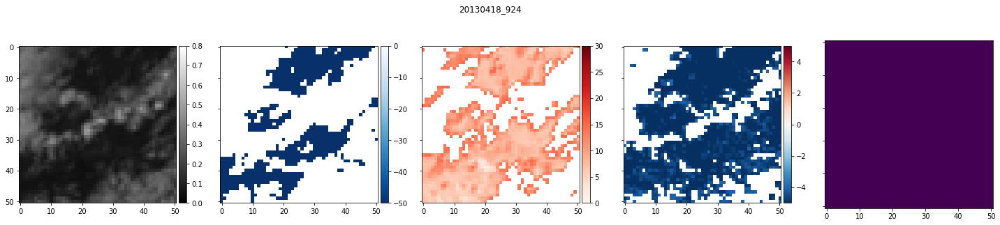

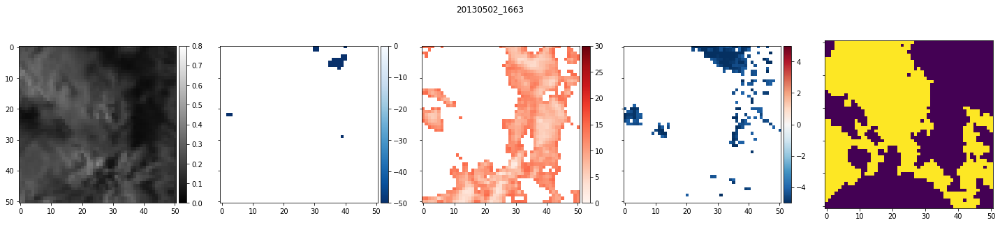

...

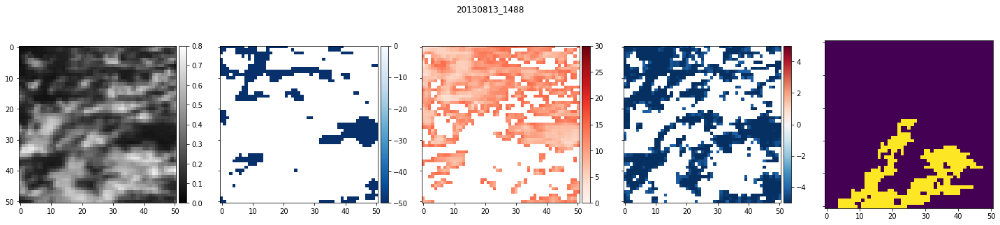

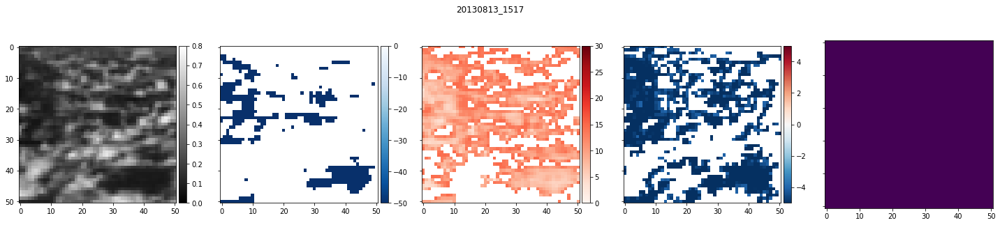

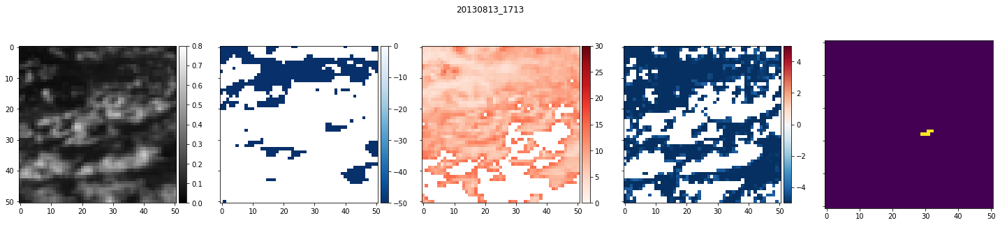

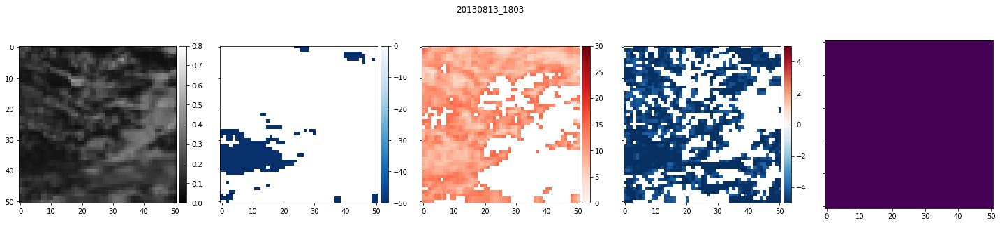

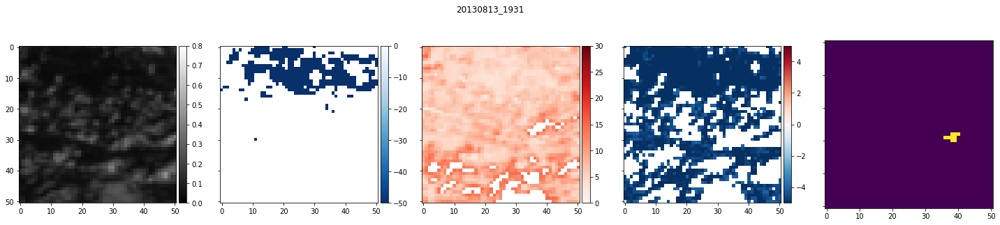

<Figure size 1800x360 with 0 Axes>

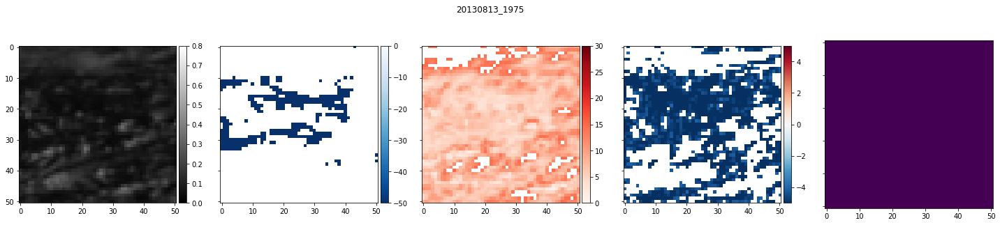

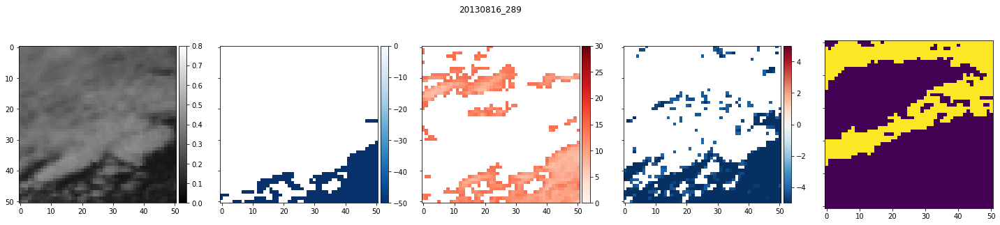

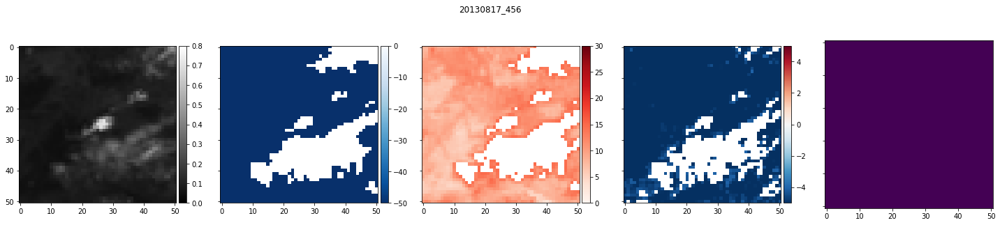

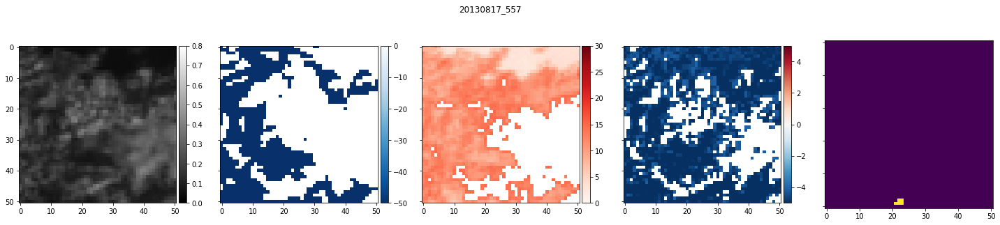

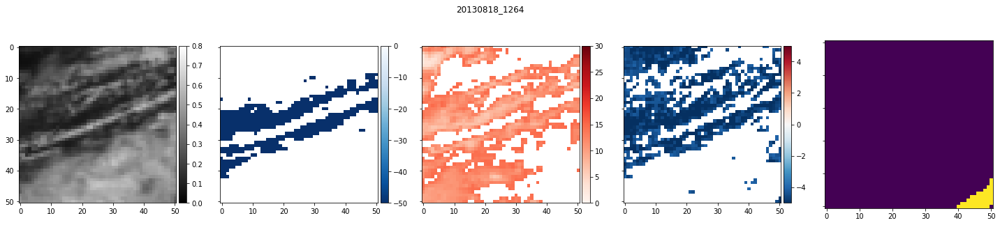

...

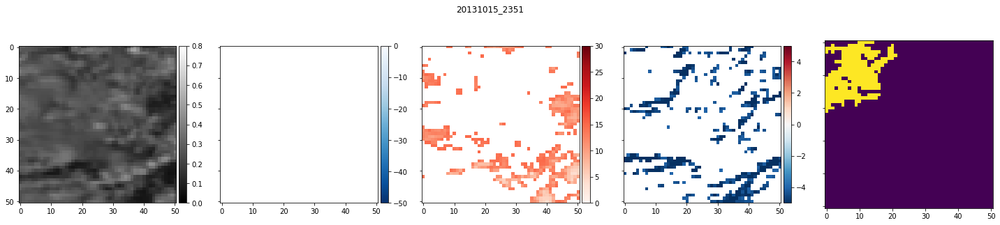

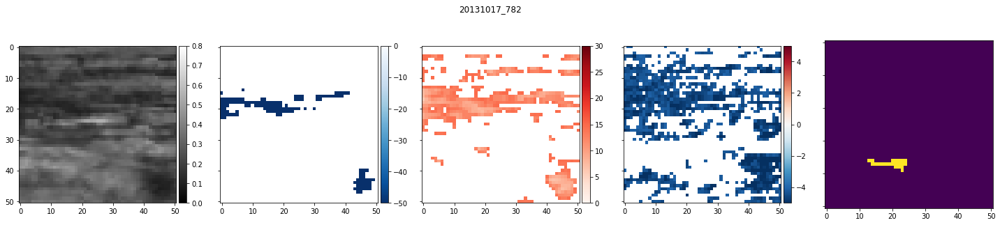

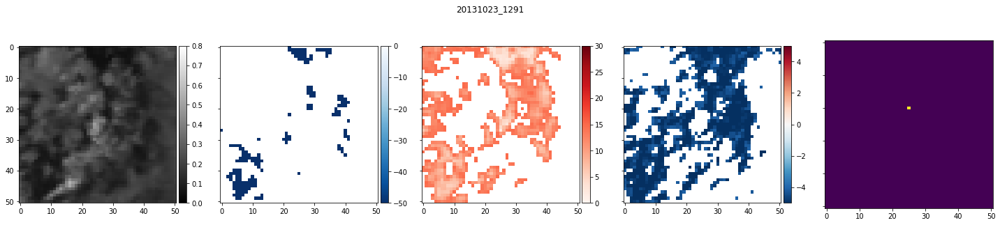

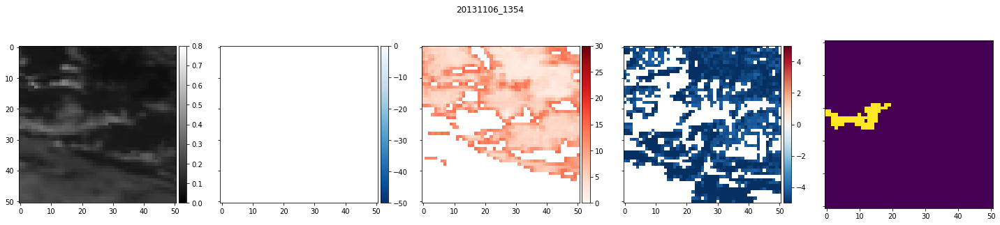

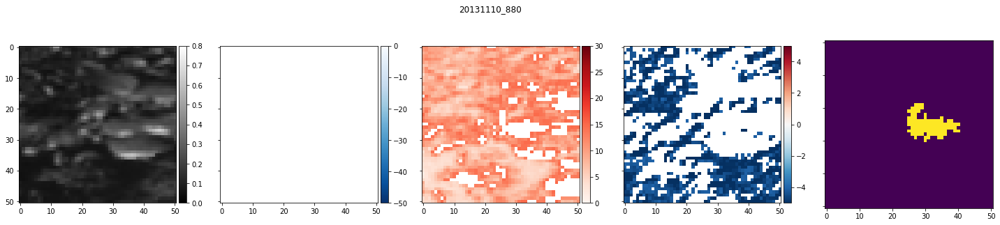

In [347]:
for i, row in haci_cases_classified.iterrows():
    try:
        with xr.open_dataset("{dp}/track_{ID}.nc".format(dp=data_path,ID=row.case_id)) as track_data:
            obj, obj_idx = get_object_locations2(track_data)
            d62_108 = track_data.wv062 - track_data.ir108
            d39_108 = track_data.ir039 - track_data.ir108
            d39_120 = track_data.ir039 - track_data.ir120
            dtri = (track_data.ir087 - track_data.ir108) - (track_data.ir108 - track_data.ir120)
            test = (track_data.ir039 - track_data.ir108) - (track_data.ir039 - track_data.ir120)

            fig,ax = plt.subplots(1,5,figsize=(25,5),sharex=True,sharey=True)
            p0 = ax[0].imshow(track_data.vis006.data[6],vmin=0,vmax=0.8,cmap='gray')
            fc.colourbar(p0)

            p1 = ax[1].imshow(np.ma.masked_greater(track_data.wv062.data[6] - track_data.ir108.data[6],d62_108_thresh),
                              vmin=-50,vmax=0,cmap='Blues_r')
            fc.colourbar(p1)

            p2 = ax[2].imshow(np.ma.masked_greater(track_data.ir039.data[6] - track_data.ir108.data[6],d39_108_thresh),
                              vmin=0,vmax=30,cmap='Reds')
            fc.colourbar(p2)
            p3 = ax[3].imshow(np.ma.masked_greater(dtri[6],dtri_thresh),vmin=-5,vmax=5,cmap='RdBu_r')
            fc.colourbar(p3)

            p4 = ax[4].imshow(obj[-1])
            plt.suptitle("{}".format(row.case_id))
    except:
        continue

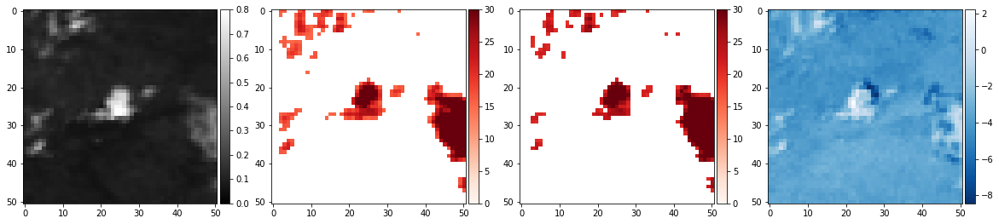

In [315]:
fig,ax = plt.subplots(1,4,figsize=(20,5))
p0 = ax[0].imshow(track_data.vis006.data[-1],vmin=0,vmax=0.8,cmap='gray')
fc.colourbar(p0)

p1 = ax[1].imshow(np.ma.masked_less(track_data.ir039.data[-1] - track_data.ir108.data[-1],d39_108_thresh),
                  vmin=0,vmax=30,cmap='Reds')
fc.colourbar(p1)

p2 = ax[2].imshow(np.ma.masked_less(d39_120[-1],d39_120_thresh),vmin=0,vmax=30,cmap='Reds')
fc.colourbar(p2)

p3 = ax[3].imshow(test[-1],cmap='Blues_r')
fc.colourbar(p3)

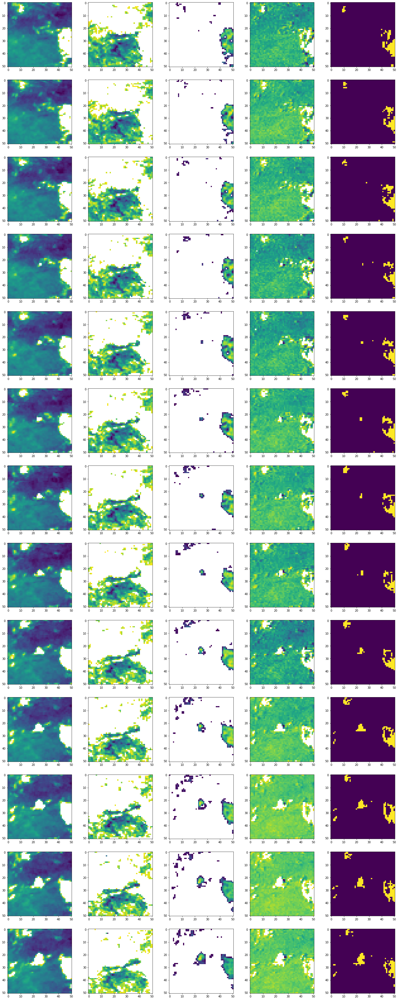

In [272]:
with xr.open_dataset("{dp}/track_{ID}.nc".format(dp=data_path,ID="20130806_469")):
    d62_108 = track_data.wv062 - track_data.ir108
    d39_108 = track_data.ir039 - track_data.ir108
    d39_120 = track_data.ir039 - track_data.ir120
    dtri = (track_data.ir087 - track_data.ir108) - (track_data.ir108 - track_data.ir120)
    
    d62_108_mask = np.ma.masked_greater(d62_108,d62_108_thresh)
    d39_108_mask = np.ma.masked_greater(d39_108,d39_108_thresh)
    d39_120_mask = np.ma.masked_less(d39_120,d39_120_thresh)
    dtri_mask = np.ma.masked_greater(dtri,dtri_thresh)
    
    mask = d62_108_mask.mask & d39_108_mask.mask & dtri_mask.mask
    
    fig,ax = plt.subplots(13,5,figsize=(25,5*13))
    for i in range(len(track_data.ir108.data)):
        ax[i,0].imshow(d62_108_mask[i])
        ax[i,1].imshow(d39_108_mask[i])
        ax[i,2].imshow(d39_120_mask[i])
        ax[i,3].imshow(dtri_mask[i])
        ax[i,4].imshow(mask[i])

In [273]:
track_data.ir039.data[6] - track_data.ir108.data[6]

array([[11.1585, 10.3245, 10.2369, ...,  9.2275,  9.5612,  9.0169],
       [12.1893, 11.258 , 11.9026, ...,  8.7516,  9.0169,  9.0201],
       [12.2951, 12.751 , 13.3053, ...,  9.3281,  9.4169,  9.4665],
       ...,
       [ 8.5848,  7.8649,  7.9832, ...,  9.5298,  9.0191, 10.0976],
       [ 9.1369,  8.6932,  8.4938, ..., 10.6621, 11.9043, 13.9622],
       [ 9.3581,  9.1369,  9.3668, ..., 12.0593, 13.8492, 14.2686]])

In [166]:
obj, obj_idx = get_object_locations2(track_data,dilation=False)

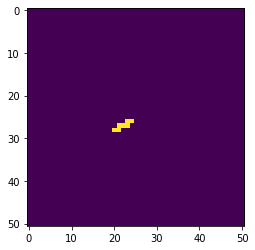

In [173]:
plt.imshow(obj[4])

In [205]:
value_keys = list(track_data.data_vars)[:-4] + ['cool_05','cool_15','wv062_wv073','wv062_wv073_t05','wv062_wv073_t15',
          'wv062_ir108','ir087_ir108','ir087_ir108_t05','ir087_ir108_t15','tri','tri_t05','tri_t15','time',
          'track_id','class']

In [181]:
gwl_data = pd.read_csv("/vols/satellite/home/lenk/data/auxillary_data/GWL.csv")

In [182]:
plt.close("all")

In [204]:
values = {k:[] for k in value_keys + ['time', 'track_id','gwl']}
ti = np.arange(-30,35,5)

for r, tr in isolated_tracks.iterrows():
#for r, tr in haci_cases_classified.iterrows():
    #try:
        track_data_path = "{}track_{}.nc".format(data_path,tr.case_id)
        #track_points_path = "{}track_{}.csv".format(track_path,tr.case_id)

        with xr.open_dataset(track_data_path) as track_data:
            wv062_wv073 = track_data.wv062.data - track_data.wv073.data
            wv062_ir108 = track_data.wv062.data - track_data.ir108.data
            ir087_ir108 = track_data.ir087.data - track_data.ir108.data
            tri = (track_data.ir087.data - track_data.ir108.data) - (track_data.ir108.data - track_data.ir120.data)

            cool_05 = [np.zeros((51,51))]
            ir087_ir108_t05 = [np.zeros((51,51))]
            wv062_wv073_t05 = [np.zeros((51,51))]
            tri_t05 = [np.zeros((51,51))]

            for i in range(1,len(track_data.ir108.data)):
                ir108_t0 = track_data.ir108.data[i-1]
                ir108_t1 = track_data.ir108.data[i]

                ir087_ir108_t0 = ir087_ir108[i-1]
                ir087_ir108_t1 = ir087_ir108[i]

                wv062_wv073_t0 = wv062_wv073[i-1]
                wv062_wv073_t1 = wv062_wv073[i]

                tri_t0 = tri[i-1]
                tri_t1 = tri[i]

                cool_05.append(ir108_t1-ir108_t0)
                ir087_ir108_t05.append(ir087_ir108_t1-ir087_ir108_t0)
                wv062_wv073_t05.append(wv062_wv073_t1-wv062_wv073_t0)
                tri_t05.append(tri_t1 - tri_t0)

            cool_15 = [np.zeros((51,51))]*3
            ir087_ir108_t15 = [np.zeros((51,51))]*3
            wv062_wv073_t15 = [np.zeros((51,51))]*3
            tri_t15 = [np.zeros((51,51))]*3

            for i in range(3,len(track_data.ir108.data)):
                ir108_t0 = track_data.ir108.data[i-3]
                ir108_t1 = track_data.ir108.data[i]

                ir087_ir108_t0 = ir087_ir108[i-3]
                ir087_ir108_t1 = ir087_ir108[i]

                wv062_wv073_t0 = wv062_wv073[i-1]
                wv062_wv073_t1 = wv062_wv073[i]

                tri_t0 = tri[i-3]
                tri_t1 = tri[i]

                cool_15.append(ir108_t1-ir108_t0)
                ir087_ir108_t15.append(ir087_ir108_t1-ir087_ir108_t0)
                wv062_wv073_t15.append(wv062_wv073_t1-wv062_wv073_t0)
                tri_t15.append(tri_t1 - tri_t0)

            #wanted_object, obj_idx = get_object_locations(track_data,track,51,dilation=False)
            wanted_object, obj_idx = get_object_locations2(track_data,DWV_thresh=-50,
                                                           DIR1_thresh= 15, DIR2_thresh=-5)

            for i in range(len(track_data.ctth.data)):
                t = ti[i]
                tid = tr.case_id
                try:
                    values['time'].extend([t]*len(obj_idx[i][0]))
                    values['track_id'].extend([tid]*len(obj_idx[i][0]))
                    values['class'].extend([tr.Klasse]*len(obj_idx[i][0]))
                    gwl = gwl_data[gwl_data.date==int(tid.split("_")[0])].iloc[0].GWL
                    values['gwl'].extend([gwl]*len(obj_idx[i][0]))                               

                    for k in values.keys():
                        if k in track_data.data_vars:
                            if k == 'time' or k =='track_id':
                                continue
                            else:
                                v = eval("track_data.{}.data[i][obj_idx[i]]".format(k))
                        else:
                            v = eval("{}[i][obj_idx[i]]".format(k))
                        values[k].extend(v)
                except Exception as e:
                    print("Fehler {} bei Track {}.".format(e, tr.case_id))
                    continue 
    #except Exception as e:
   #     print("Fehler {} bei Track {}.".format(e,tr.case_id))
    #    continue

Fehler name 'time' is not defined bei Track 20130618_1985.
Fehler name 'time' is not defined bei Track 20130618_1985.
Fehler name 'time' is not defined bei Track 20130618_1985.
Fehler name 'time' is not defined bei Track 20130618_1985.
Fehler name 'time' is not defined bei Track 20130618_1985.
Fehler name 'time' is not defined bei Track 20130618_1985.
Fehler name 'time' is not defined bei Track 20130618_1985.
Fehler name 'time' is not defined bei Track 20130618_1985.
Fehler name 'time' is not defined bei Track 20130618_1985.
Fehler name 'time' is not defined bei Track 20130618_1985.
Fehler name 'time' is not defined bei Track 20130618_1985.
Fehler name 'time' is not defined bei Track 20130618_1985.
Fehler name 'time' is not defined bei Track 20130618_1985.
Fehler name 'time' is not defined bei Track 20130806_469.
Fehler name 'time' is not defined bei Track 20130806_469.
Fehler name 'time' is not defined bei Track 20130806_469.
Fehler name 'time' is not defined bei Track 20130806_469.
F

In [206]:
for k in values:
    print("{}: {}".format(k,len(values[k])))

vis006: 83
vis008: 83
ir016: 83
ir039: 83
wv062: 83
wv073: 83
ir087: 83
ir097: 83
ir108: 83
ir120: 83
ir134: 83
hrv: 83
ct: 83
ctth: 83
cma: 83
rx: 83
cool_05: 83
cool_15: 83
wv062_wv073: 83
wv062_wv073_t05: 83
wv062_wv073_t15: 83
wv062_ir108: 83
ir087_ir108: 83
ir087_ir108_t05: 83
ir087_ir108_t15: 83
tri: 83
tri_t05: 83
tri_t15: 83
time: 83
track_id: 83
class: 83
gwl: 83


In [207]:
values_df = pd.DataFrame.from_dict(values)

In [208]:
values_df = values_df[values_df.track_id!='20130609_699']

In [209]:
values_df['class'] = values_df['class'].replace({1:'isolated',
                                                 2:'cloud field',
                                                 3:'below clouds',
                                                 4:'border'})

In [210]:
values_df.head()

,vis006,vis008,ir016,ir039,wv062,wv073,ir087,ir097,ir108,ir120,...,ir087_ir108,ir087_ir108_t05,ir087_ir108_t15,tri,tri_t05,tri_t15,time,track_id,class,gwl
0,0.2123,0.2665,0.1863,286.6857,235.5546,251.6586,273.9432,252.1626,272.8477,274.1058,...,1.0955,0.0000,0.0,2.3536,0.0000,0.0,-30,20130618_1985,isolated,TRW
1,0.1052,0.1780,0.1176,296.1707,235.6932,253.0217,284.5879,257.0094,284.8858,283.1409,...,-0.2979,0.0846,0.0,-2.0428,0.4305,0.0,-25,20130618_1985,isolated,TRW
2,0.1743,0.2309,0.1642,290.1526,235.2755,251.0612,276.0260,252.1626,276.7262,275.1978,...,-0.7002,-1.1943,0.0,-2.2286,-1.2530,0.0,-25,20130618_1985,isolated,TRW
3,0.2033,0.2596,0.1898,289.8729,236.0371,251.4604,273.1453,251.0484,275.3484,273.1612,...,-2.2031,0.0488,0.0,-4.3903,0.6085,0.0,-25,20130618_1985,isolated,TRW
4,0.1282,0.2010,0.1502,298.0378,236.3772,254.7147,286.1633,257.5769,286.2755,285.4369,...,-0.1122,0.8681,0.0,-0.9508,1.3796,0.0,-25,20130618_1985,isolated,TRW


In [203]:
# values_df.to_csv("/vols/satellite/home/lenk/proj/2019-01_trackingstudie/data/case_data_objects_2013.csv",index=False,float_format="%.3f")

Text(0, 0.5, 'CTTH / m')

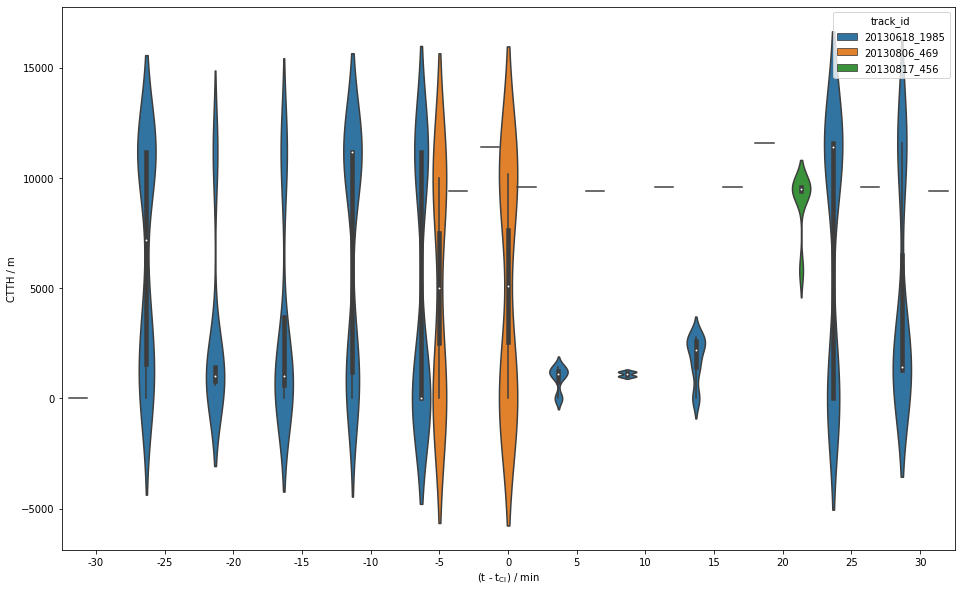

In [211]:
fig,ax = plt.subplots(1,1,figsize=(16,10))
ax = sns.violinplot(x='time',y='ctth',data=values_df,bw=0.4,notch=True,hue='track_id')#,hue='track_id')
ax.set_xlabel(r"(t - t$_\mathrm{CI}$) / min")
ax.set_ylabel(r"CTTH / m")

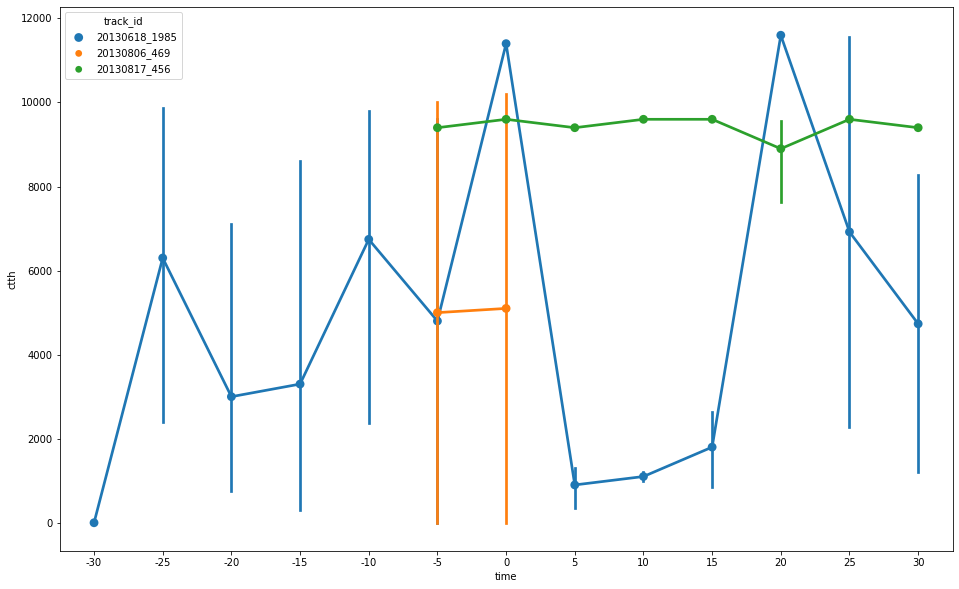

In [212]:
fig,ax = plt.subplots(1,1,figsize=(16,10))
ax = sns.pointplot(x='time',y='ctth',hue='track_id',data=values_df)

Text(0.5, 1.0, 'IR$\\,$10,8$\\,$µm')

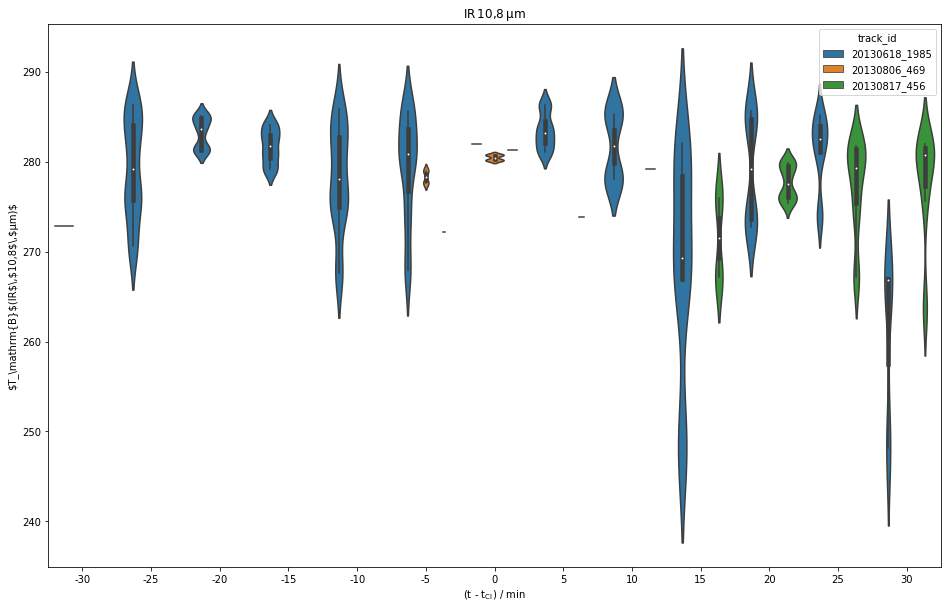

In [213]:
fig,ax = plt.subplots(1,1,figsize=(16,10))
ax = sns.violinplot(x='time',y='ir108',data=values_df,bw=0.4,notch=True,scale='count',hue='track_id')
ax.set_xlabel(r"(t - t$_\mathrm{CI}$) / min")
ax.set_ylabel(r"$T_\mathrm{B}$(IR$\,$10,8$\,$µm)$")
ax.set_title(r"IR$\,$10,8$\,$µm")
#ax.set_ylim(-20,20)

(-20, 20)

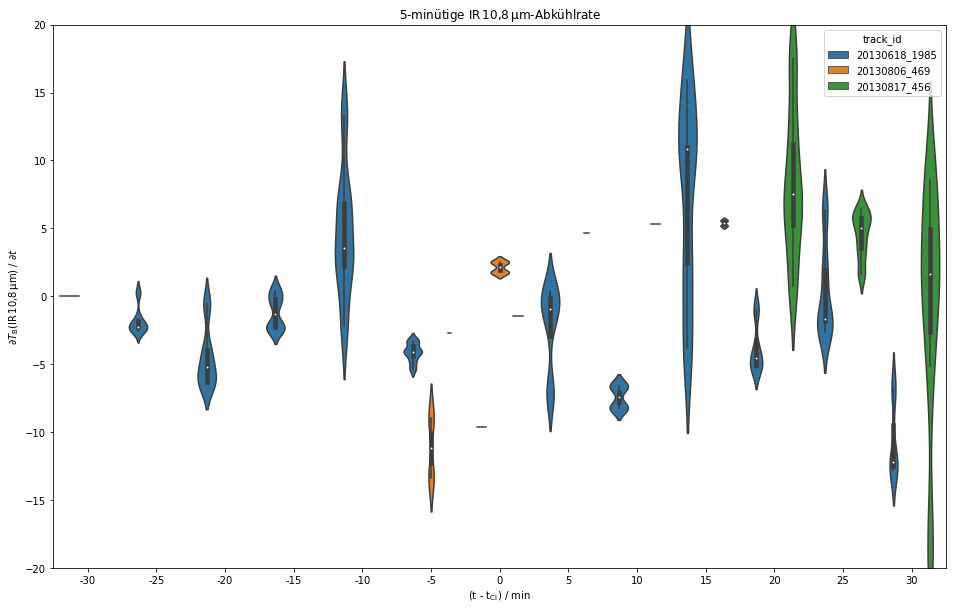

In [214]:
fig,ax = plt.subplots(1,1,figsize=(16,10))
ax = sns.violinplot(x='time',y='cool_05',data=values_df,bw=0.4,notch=True,scale='count',hue='track_id')
ax.set_xlabel(r"(t - t$_\mathrm{CI}$) / min")
ax.set_ylabel(r"$\partial T_\mathrm{B}$(IR$\,$10,8$\,$µm) / $\partial t$")
ax.set_title(r"5-minütige IR$\,$10,8$\,$µm-Abkühlrate")
ax.set_ylim(-20,20)

Text(0.5, 1.0, '15-minütige IR$\\,$10,8$\\,$µm-Abkühlrate')

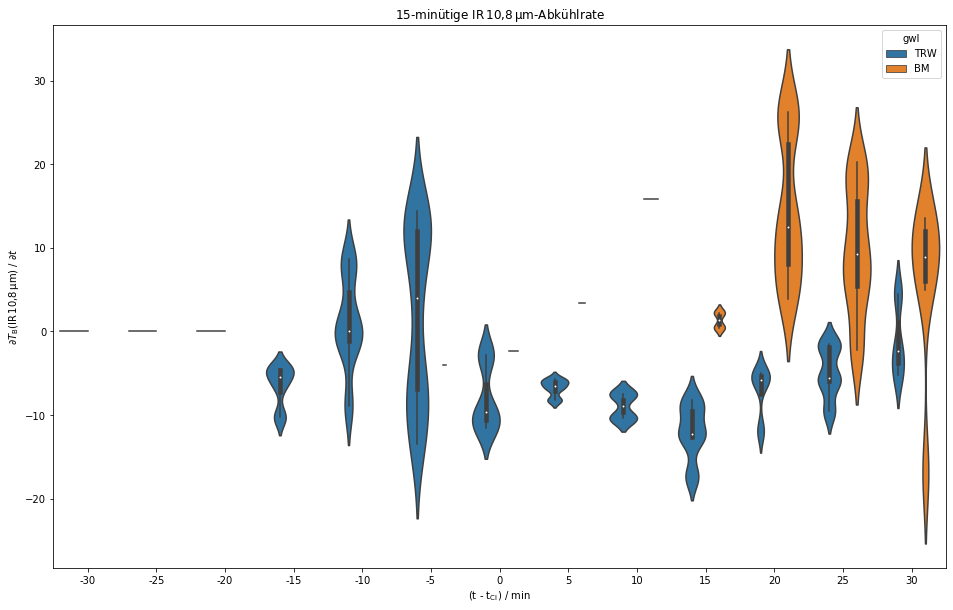

In [215]:
fig,ax = plt.subplots(1,1,figsize=(16,10))
ax = sns.violinplot(x='time',y='cool_15',data=values_df,bw=0.4,notch=True,scale='count',hue='gwl')
ax.set_xlabel(r"(t - t$_\mathrm{CI}$) / min")
ax.set_ylabel(r"$\partial T_\mathrm{B}$(IR$\,$10,8$\,$µm) / $\partial t$")
ax.set_title(r"15-minütige IR$\,$10,8$\,$µm-Abkühlrate")

Text(0, 0.5, '$\\Delta T_\\mathrm{B}(\\mathrm{WV}\\,6,2\\,$µm$; \\mathrm{WV}\\,7,3\\,$µm$)$')

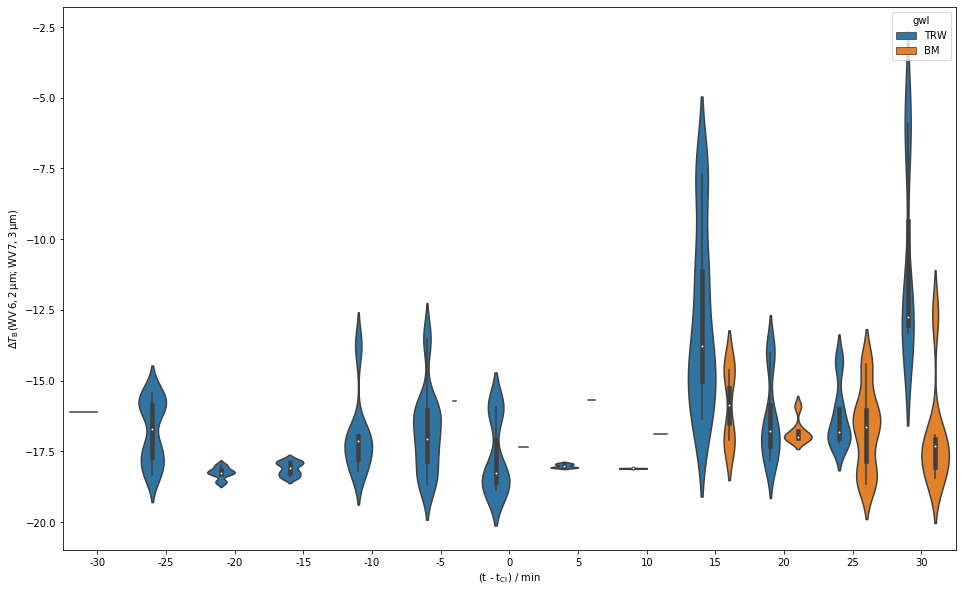

In [216]:
fig,ax = plt.subplots(1,1,figsize=(16,10))
ax = sns.violinplot(x='time',y='wv062_wv073',data=values_df,bw=0.4,notch=True,scale='count',hue='gwl')
ax.set_xlabel(r"(t - t$_\mathrm{CI}$) / min")
ax.set_ylabel(r"$\Delta T_\mathrm{B}(\mathrm{WV}\,6,2\,$µm$; \mathrm{WV}\,7,3\,$µm$)$")

Text(0, 0.5, '$\\Delta T_\\mathrm{B}(\\mathrm{WV}\\,6,2\\,$µm$; \\mathrm{WV}\\,7,3\\,$µm$)$')

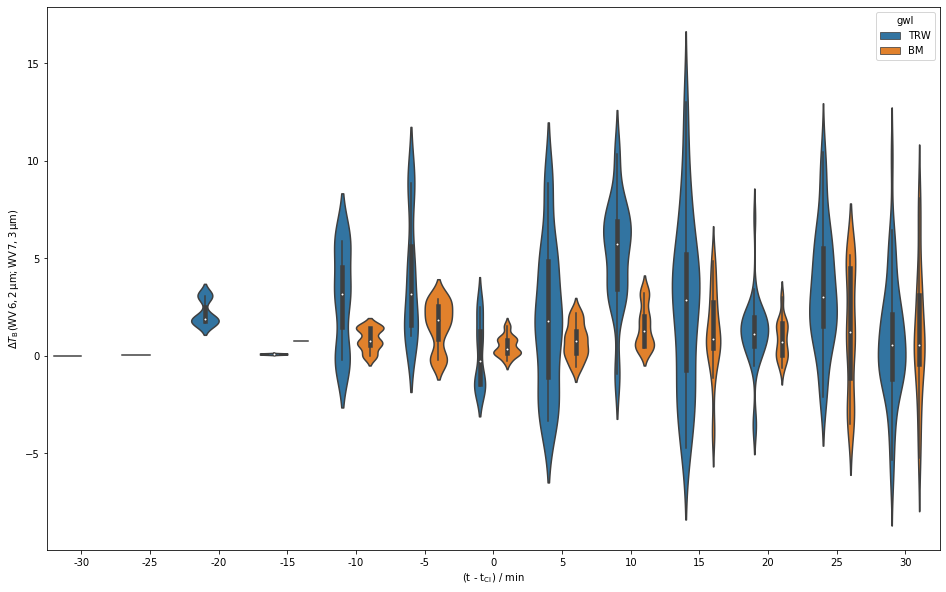

In [339]:
fig,ax = plt.subplots(1,1,figsize=(16,10))
ax = sns.violinplot(x='time',y='wv062_wv073_t05',
                    data=values_df,
                    bw=0.4,
                    notch=True,scale='count',hue='gwl')
ax.set_xlabel(r"(t - t$_\mathrm{CI}$) / min")
ax.set_ylabel(r"$\Delta T_\mathrm{B}(\mathrm{WV}\,6,2\,$µm$; \mathrm{WV}\,7,3\,$µm$)$")

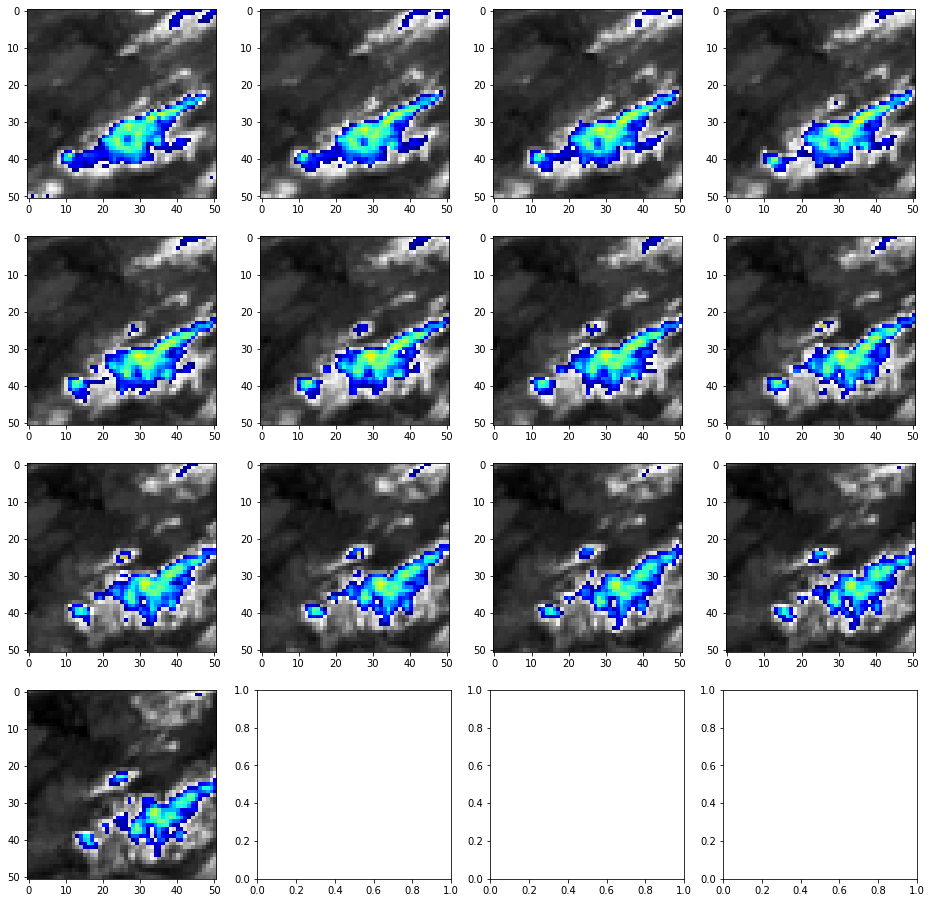

In [285]:
file_name = "{}/2019-01_trackingstudie/data/lagrangian_tracks/field_data/track_{}.nc".format(proj_path,isolated_tracks.iloc[-1].case_id)

with xr.open_dataset(file_name) as track_data:
    obj, obj_idx = get_object_locations2(track_data)
    fig,ax = plt.subplots(4,4,figsize=(16,16))
    axs = ax.ravel()
    
    for i, ir in enumerate(track_data.ir108.data):
        axs[i].imshow(ir,vmin=210,vmax=300,cmap=emap)
        axs[i].imshow(np.ma.masked_less(obj[i],1),vmin=0.5,vmax=1,alpha=0.8)

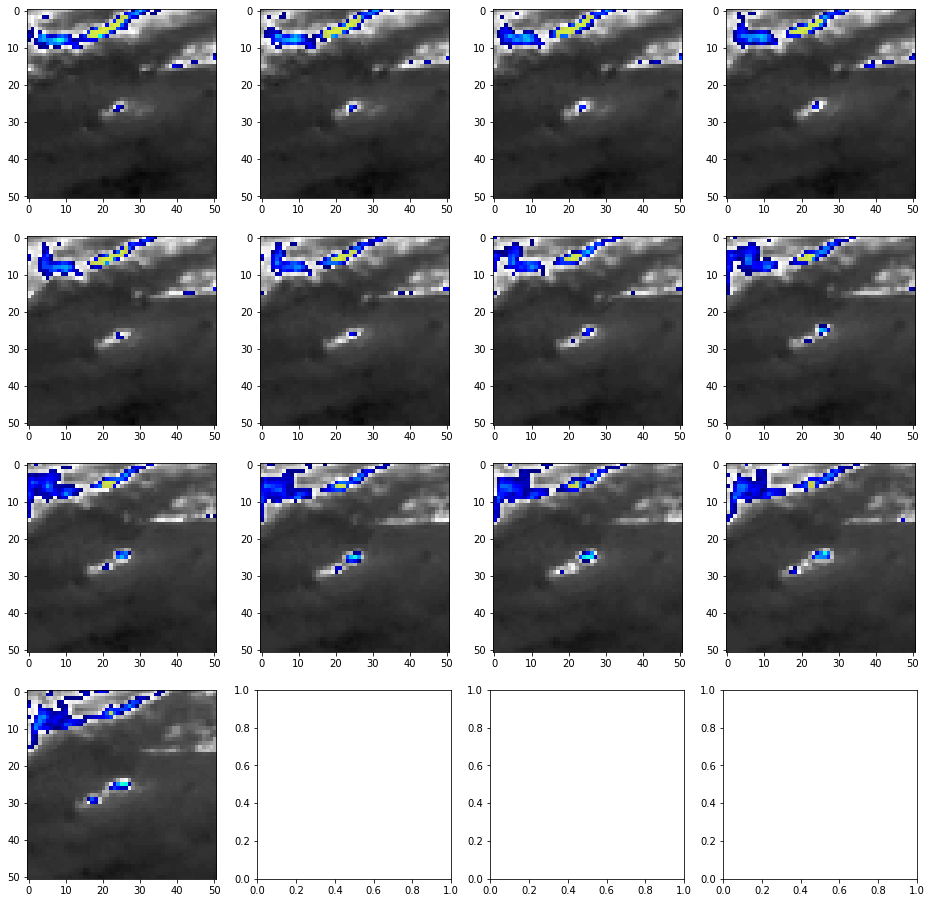

In [286]:
file_name = "{}/2019-01_trackingstudie/data/lagrangian_tracks/field_data/track_{}.nc".format(proj_path,isolated_tracks.iloc[0].case_id)

with xr.open_dataset(file_name) as track_data:
    obj, obj_idx = get_object_locations2(track_data)
    fig,ax = plt.subplots(4,4,figsize=(16,16))
    axs = ax.ravel()
    
    for i, ir in enumerate(track_data.ir108.data):
        axs[i].imshow(ir,vmin=210,vmax=300,cmap=emap)
        axs[i].imshow(np.ma.masked_less(obj[i],1),vmin=0.5,vmax=1,alpha=0.8)

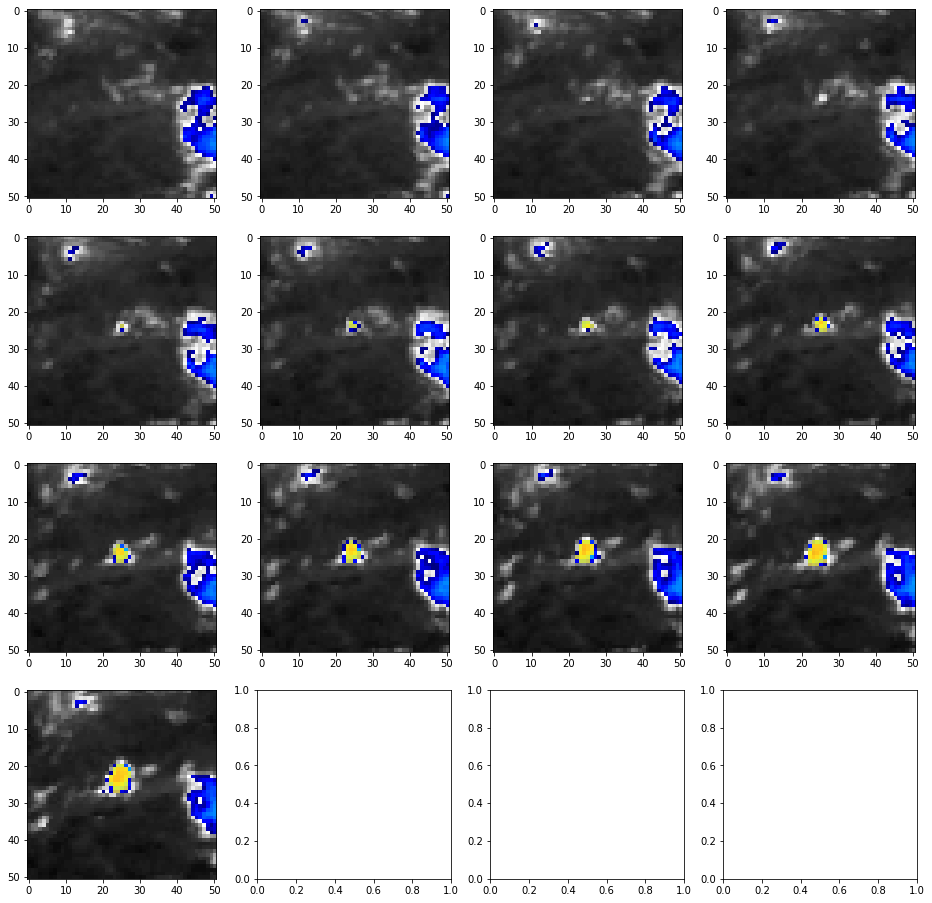

In [287]:
file_name = "{}/2019-01_trackingstudie/data/lagrangian_tracks/field_data/track_{}.nc".format(proj_path,isolated_tracks.iloc[1].case_id)

with xr.open_dataset(file_name) as track_data:
    obj, obj_idx = get_object_locations2(track_data)
    fig,ax = plt.subplots(4,4,figsize=(16,16))
    axs = ax.ravel()
    
    for i, ir in enumerate(track_data.ir108.data):
        axs[i].imshow(ir,vmin=210,vmax=300,cmap=emap)
        axs[i].imshow(np.ma.masked_less(obj[i],1),vmin=0.5,vmax=1,alpha=0.8)

Die multispektrale Objektdefinition scheint leider nur bei realtiv einfachen Fällen gut zu funktionieren.